In [1]:
cd ..

/Users/wesgurnee/Documents/mechint/ordinal-probing


In [2]:
# autoreload
%load_ext autoreload
%autoreload 2

import numpy as np
import sklearn
import pandas as pd
import matplotlib.pyplot as plt
import torch
from scipy.stats import rankdata
from load import load_model
import datasets
import seaborn as sns
import geopandas as gpd

from feature_datasets.common import *
import utils
import os
from probes.evaluation import *

from probe_experiment import load_probe_results

%matplotlib inline

In [3]:
world_df = load_entity_data('world_place')
us_df = load_entity_data('us_place')
nyc_df = load_entity_data('nyc_place')

world_shapes = gpd.read_file('data/shapes/WB_countries_Admin0_lowres.geojson')
us_shapes = gpd.read_file('data/shapes/cb_2018_us_state_20m')
US_FILTER_LIST = ['PR', 'AK', 'HI']
us_shapes = us_shapes.loc[~us_shapes.STUSPS.isin(US_FILTER_LIST)]
nyc_shapes = gpd.read_file('data/shapes/borough_boundaries.geojson')


experiment_name = 'full_prompts'
model_name = 'Llama-2-70b-hf'
feature_name = 'coords'
world_layer = 54
us_layer = 46
nyc_layer = 55

world_probe_result = load_probe_results(experiment_name, model_name, 'world_place', feature_name, 'coords')
us_probe_result = load_probe_results(experiment_name, model_name, 'us_place', feature_name, 'where_us')
nyc_probe_result = load_probe_results(experiment_name, model_name, 'nyc_place', feature_name, 'where_nyc')


In [4]:
world_rdf = pd.DataFrame(world_probe_result['scores']).T
us_rdf = pd.DataFrame(us_probe_result['scores']).T
nyc_rdf = pd.DataFrame(nyc_probe_result['scores']).T

In [5]:
world_projection_df = world_probe_result['projections'][world_layer]
us_projection_df = us_probe_result['projections'][us_layer]
nyc_projection_df = nyc_probe_result['projections'][nyc_layer]

In [6]:
display(world_projection_df.groupby('is_test').prox_error.mean())
display(us_projection_df.groupby('is_test').prox_error.mean())
display(nyc_projection_df.groupby('is_test').prox_error.mean())



is_test
False    0.071609
True     0.083741
Name: prox_error, dtype: float64

is_test
False    0.108475
True     0.125132
Name: prox_error, dtype: float64

is_test
False    0.202816
True     0.280370
Name: prox_error, dtype: float64

In [7]:
display(world_projection_df.groupby('is_test').prox_error.mean())
display(us_projection_df.groupby('is_test').prox_error.mean())
display(nyc_projection_df.groupby('is_test').prox_error.mean())

is_test
False    0.071609
True     0.083741
Name: prox_error, dtype: float64

is_test
False    0.108475
True     0.125132
Name: prox_error, dtype: float64

is_test
False    0.202816
True     0.280370
Name: prox_error, dtype: float64

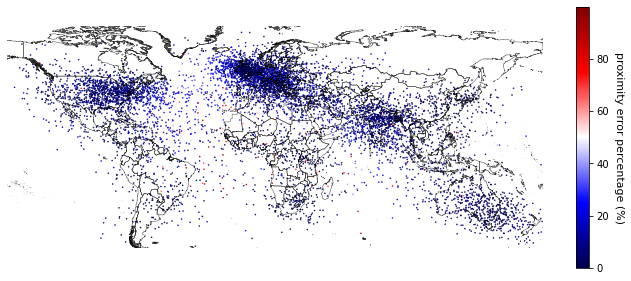

In [15]:
from matplotlib.colors import LogNorm

world_is_test = world_projection_df.is_test.values
world_test_error = world_projection_df.prox_error.values[world_is_test]

world_x_pred = world_projection_df.x.values[world_is_test]
world_y_pred = world_projection_df.y.values[world_is_test]

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(world_x_pred, world_y_pred, s=0.3, c=world_test_error*100, cmap='seismic')#, norm=LogNorm(vmin=8e-1, vmax=100))
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.7)
ax.set_ylim(-55, 79)
ax.set_xlim(-151, 180)
ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error percentage (%)', rotation=270, labelpad=15, fontsize=11)

plt.show()

In [16]:
from feature_datasets.space_world import COUNTRY_CONTINENTS
world_df['continent'] = world_df.country.apply(lambda x: COUNTRY_CONTINENTS.get(x, ''))

CONTINENT_COLOR_CODES = {
    'North America': '#1f77b4',
    'Africa': '#ff7f0e',
    'Europe': '#2ca02c',
    'Asia': '#d62728',
    'Oceania': '#9467bd',
    'South America': '#e377c2',
    'Antarctica': '#8c564b',
    '': '#ffffff'
}

In [17]:
from matplotlib.colors import LogNorm

def plot_main_world_plot(world_projection_df, world_shapes, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))

    world_is_test = world_projection_df.is_test.values
    world_test_error = world_projection_df.prox_error.values[world_is_test]

    world_x_pred = world_projection_df.x.values[world_is_test]
    world_y_pred = world_projection_df.y.values[world_is_test]

    continents = world_df.continent.values[world_is_test]
    continent_colors = world_df.continent.map(CONTINENT_COLOR_CODES)[world_is_test]

    sc = ax.scatter(world_x_pred, world_y_pred, s=0.5, c=continent_colors)#, norm=LogNorm(vmin=8e-1, vmax=100))
    world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.7)
    ax.set_ylim(-55, 79)
    ax.set_xlim(-151, 180)
    ax.axis('off')

    # turn CONTINENT_COLOR_CODES into a legend
    # Create handles and labels for the legend
    handles = [plt.Rectangle((0,0),1,1, color=color) for color in CONTINENT_COLOR_CODES.values()]
    labels = list(CONTINENT_COLOR_CODES.keys())

    # Create a legend with the handles and labels
    ax.legend(handles[:-2], labels[:-2], title="True Continent", loc='lower left', bbox_to_anchor=(0.0, 0.0))

    #plt.title('Llama-2-70b Linear Least Squares Projections of World Places')


In [18]:
import networkx as nx

# Create a planar contiguity graph
state_index = {}
graph = nx.Graph()
for index, row in us_shapes.iterrows():
    state_index[row.STUSPS] = index
    graph.add_node(index)
    neighbors = us_shapes[us_shapes.geometry.touches(row['geometry'])].index.tolist()
    for neighbor in neighbors:
        graph.add_edge(index, neighbor)

In [19]:
coloring = nx.coloring.greedy_color(graph, strategy='largest_first')


/tmp/ipykernel_452720/1204570658.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  us_shapes.centroid.plot()


<AxesSubplot:>

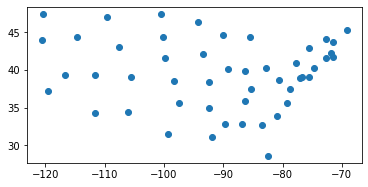

In [13]:
us_shapes.centroid.plot()

In [20]:
state_coloring = {s: coloring[i] for s, i in state_index.items()}
state_coloring = {
    'AL': 2, 
    'AR': 2, 
    'AZ': 1, 
    'CA': 0, 
    'CO': 4, 
    'CT': 2, 
    'DC': 2, 
    'DE': 2, 
    'FL': 1, 
    'GA': 0, 
    'IA': 1, 
    'ID': 0, 
    'IL': 3, 
    'IN': 0, 
    'KS': 3, 
    'KY': 2, 
    'LA': 4, 
    'MA': 0, 
    'MD': 1, 
    'ME': 0, 
    'MI': 2, 
    'MN': 2, 
    'MO': 0, 
    'MS': 0, 
    'MT': 2, 
    'NC': 2, 
    'ND': 4, 
    'NE': 2, 
    'NH': 1, 
    'NJ': 3, 
    'NM': 5, 
    'NV': 3, 
    'NY': 1, 
    'OH': 5, 
    'OK': 1, 
    'OR': 1, 
    'PA': 0, 
    'RI': 4, 
    'SC': 5, 
    'SD': 0, 
    'TN': 1, 
    'TX': 0, 
    'UT': 2, 
    'VA': 0, 
    'VT': 2, 
    'WA': 4, 
    'WI': 0, 
    'WV': 3, 
    'WY': 1
}


In [21]:
STATE_COLOR_CODES = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#e377c2',
}

In [22]:
us_projection_df['state_id'] = us_df.state_id.values
median_pred_x = us_projection_df[us_is_test].groupby('state_id').x.median().sort_index()
median_pred_y = us_projection_df[us_is_test].groupby('state_id').y.median().sort_index()

NameError: name 'us_is_test' is not defined

In [23]:
from matplotlib.lines import Line2D

def plot_main_us_plot(us_projection_df, us_shapes, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))

    us_is_test = us_projection_df.is_test.values

    us_projection_df['state_id'] = us_df.state_id.values
    median_pred_x = us_projection_df[us_is_test].groupby('state_id').x.median().sort_index()
    median_pred_y = us_projection_df[us_is_test].groupby('state_id').y.median().sort_index()

    us_df['color'] = us_df.state_id.apply(lambda x: state_coloring[x])

    us_test_error = us_projection_df.prox_error.values[us_is_test]

    us_x_pred = us_projection_df.x.values[us_is_test]
    us_y_pred = us_projection_df.y.values[us_is_test]

    us_colors = us_df['color'].apply(lambda x: STATE_COLOR_CODES[x]).values[us_is_test]

    sc = ax.scatter(us_x_pred, us_y_pred, s=1, c=us_colors)
    us_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.7)

    ax.axis('off')

    ax.set_ylim(24, 50)
    ax.set_xlim(-127, -66)

    # plot medians with state label annotations
    median_color = [STATE_COLOR_CODES[state_coloring[sid]] for sid in median_pred_x.index.values]
    ax.scatter(median_pred_x.values, median_pred_y.values, c=median_color, linewidths=1)
    for i, txt in enumerate(median_pred_x.index):
        ax.annotate(txt, (median_pred_x.values[i], median_pred_y.values[i]), fontsize=11)


    legend_elements = [Line2D([0], [0], marker='o', color='w', label='True State (color)', markersize=4, markerfacecolor='red', markeredgewidth=2),
                    Line2D([0], [0], marker='o', color='w', label='Predicted Medoid', markersize=10, markerfacecolor='red', markeredgewidth=2)]

    ax.legend(handles=legend_elements, loc='lower left', bbox_to_anchor=(0.025, 0.025))


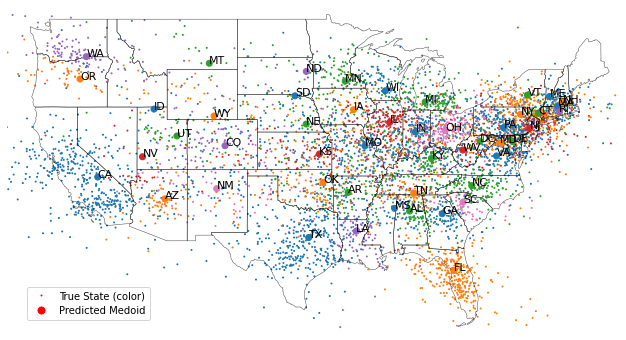

In [26]:
plot_main_us_plot(us_projection_df, us_shapes)
plt.savefig('figures/us_large.png', bbox_inches='tight', dpi=300)

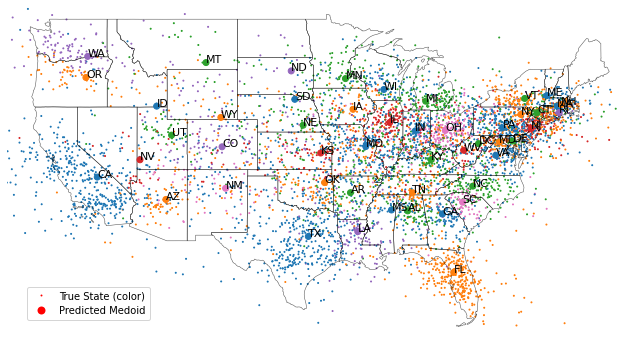

In [17]:
plot_main_us_plot(us_projection_df, us_shapes)


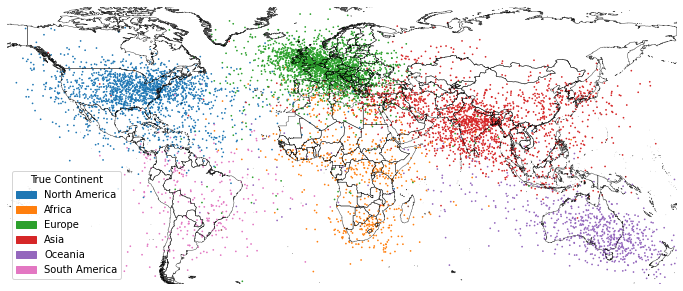

In [27]:
plot_main_world_plot(world_projection_df, world_shapes)
plt.savefig('figures/world_large.png', bbox_inches='tight', dpi=300)


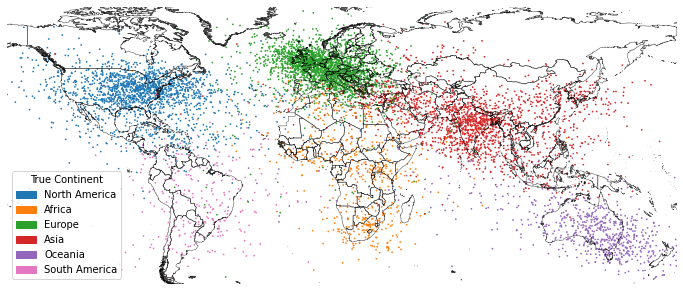

In [18]:
plot_main_world_plot(world_projection_df, world_shapes)


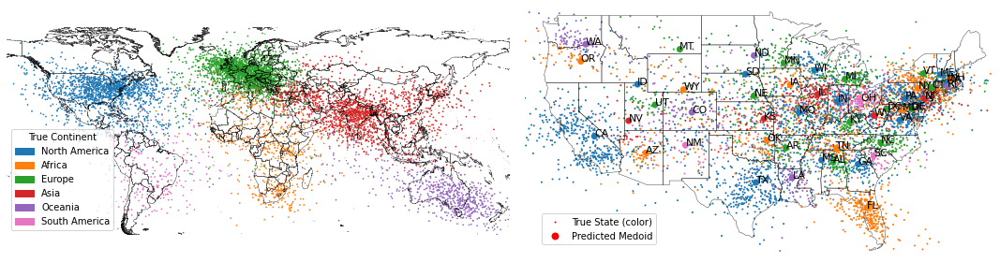

In [28]:
fig, axs = plt.subplots(1, 2, figsize=(15, 4), gridspec_kw={'width_ratios': [1.05, 1]})

plot_main_world_plot(world_projection_df, world_shapes, ax=axs[0])
plot_main_us_plot(us_projection_df, us_shapes, ax=axs[1])

plt.tight_layout()
plt.savefig('figures/world_and_us_main.png', bbox_inches='tight', dpi=300)

In [19]:
us_df[['state_id', 'color']].drop_duplicates().sort_values('state_id')

,state_id,color
66,AL,2
96,AR,2
10,AZ,1
1,CA,0
18,CO,0
51,CT,2
8,DC,2
1726,DE,2
3,FL,1
7,GA,0


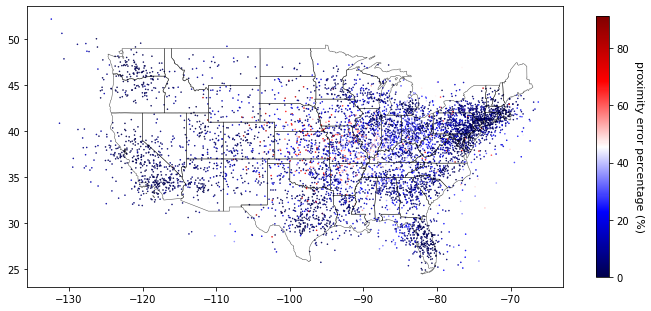

In [39]:
from matplotlib.colors import LogNorm

us_is_test = us_projection_df.is_test.values
us_test_error = us_projection_df.prox_error.values[us_is_test]

us_x_pred = us_projection_df.x.values[us_is_test]
us_y_pred = us_projection_df.y.values[us_is_test]

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(us_x_pred, us_y_pred, s=0.3, c=us_test_error*100, cmap='seismic')
us_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.7)

#ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error percentage (%)', rotation=270, labelpad=15, fontsize=11)

plt.show()

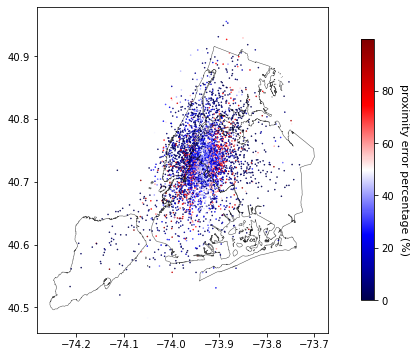

In [50]:
from matplotlib.colors import LogNorm

nyc_is_test = nyc_projection_df.is_test.values
nyc_test_error = nyc_projection_df.prox_error.values[nyc_is_test]

nyc_x_pred = nyc_projection_df.x.values[nyc_is_test]
nyc_y_pred = nyc_projection_df.y.values[nyc_is_test]

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(nyc_x_pred, nyc_y_pred, s=0.3, c=nyc_test_error*100, cmap='seismic')
nyc_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.7)

#ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error percentage (%)', rotation=270, labelpad=15, fontsize=11)

plt.show()

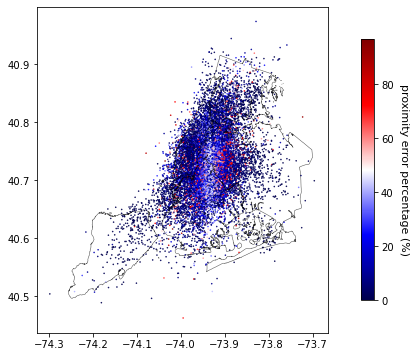

In [51]:
from matplotlib.colors import LogNorm

nyc_is_test = ~nyc_projection_df.is_test.values
nyc_test_error = nyc_projection_df.prox_error.values[nyc_is_test]

nyc_x_pred = nyc_projection_df.x.values[nyc_is_test]
nyc_y_pred = nyc_projection_df.y.values[nyc_is_test]

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(nyc_x_pred, nyc_y_pred, s=0.3, c=nyc_test_error*100, cmap='seismic')
nyc_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.7)

#ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error percentage (%)', rotation=270, labelpad=15, fontsize=11)

plt.show()

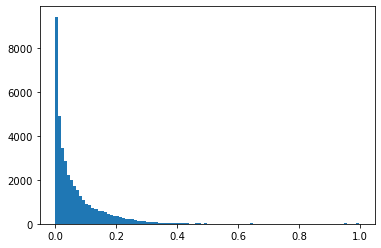

In [16]:
plt.hist(world_projection_df.prox_error.values, bins=100);

In [5]:
world_probe_result.keys()


dict_keys(['scores', 'projections', 'probe_directions', 'probe_biases', 'probe_alphas'])

In [26]:
world_proj_df = world_dfs[57]
is_test = world_proj_df.is_test.values
pred = world_proj_df[['x', 'y']].values
true = pred + world_proj_df[['x_error', 'y_error']].values

error_matrix = compute_proximity_error_matrix(
        true, pred, pairwise_haversine_distance)

train_error, test_error, combined_error = proximity_scores(
    error_matrix, is_test)

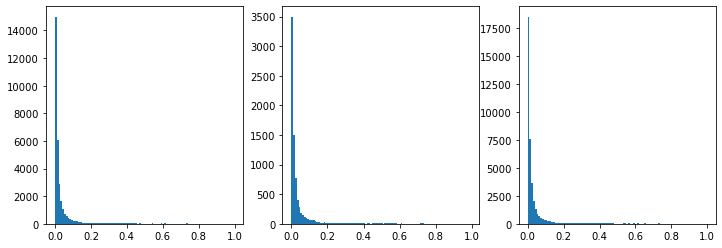

In [27]:
# histogram for each of train, test, combined error
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

axs[0].hist(train_error, bins=100)
axs[1].hist(test_error, bins=100)
axs[2].hist(combined_error, bins=100);

In [28]:
test_error.mean(), combined_error[is_test].mean()

(0.049664712468020934, 0.04956680071339491)

In [29]:
np.logspace(1, 4, 12).round(0).astype(int)

array([   10,    19,    35,    66,   123,   231,   433,   811,  1520,
        2848,  5337, 10000])

In [30]:
haversine_error = haversine_distance(true, pred)


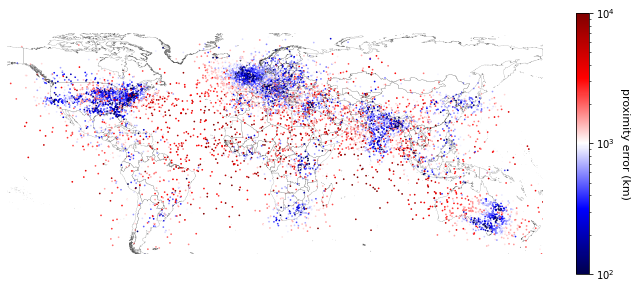

In [31]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(world_proj_df.y.values[is_test], world_proj_df.x.values[is_test], s=0.5, c=haversine_error[is_test], cmap='seismic', norm=LogNorm(vmin=1e2, vmax=1e4))
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.2, alpha=0.5)
ax.set_ylim(-55, 79)
ax.set_xlim(-151, 180)
ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error (km)', rotation=270, labelpad=15, fontsize=11)

plt.show()

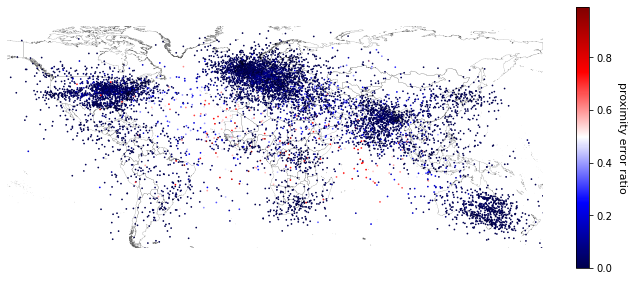

In [32]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(world_proj_df.y.values[is_test], world_proj_df.x.values[is_test], s=0.5, c=test_error, cmap='seismic')
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.2, alpha=0.5)
ax.set_ylim(-55, 79)
ax.set_xlim(-151, 180)
ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error ratio', rotation=270, labelpad=15, fontsize=11)

plt.show()

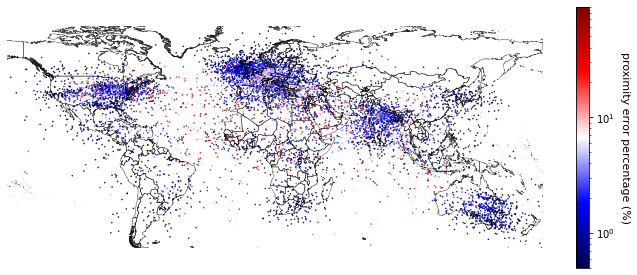

In [34]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(world_proj_df.y.values[is_test], world_proj_df.x.values[is_test], s=0.3, c=test_error*100, cmap='seismic', norm=LogNorm(vmin=5e-1, vmax=9e1))
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.7)
ax.set_ylim(-55, 79)
ax.set_xlim(-151, 180)
ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error percentage (%)', rotation=270, labelpad=15, fontsize=11)

plt.show()

In [46]:
train_lon_proj = world_proj_df.y.values[~is_test]
train_lat_proj = world_proj_df.x.values[~is_test]

train_lon_true = world_df.longitude.values[~is_test]
train_lat_true = world_df.latitude.values[~is_test]


In [48]:
from reconstruction import *
del_graph = make_delauney_graph(train_lon_proj, train_lat_proj)
mesh_graph = convert_delauney_graph_to_mesh_graph(del_graph, train_lon_proj, train_lat_proj, prune=True)

In [51]:
reconstructed_lon, reconstructed_lat = quad_mesh_preservation_mesh_morphing(mesh_graph, train_lon_proj, train_lat_proj, train_lon_true, train_lat_true)

-----------------------------------------------------------------
           OSQP v0.6.3  -  Operator Splitting QP Solver
              (c) Bartolomeo Stellato,  Goran Banjac
        University of Oxford  -  Stanford University 2021
-----------------------------------------------------------------
problem:  variables n = 63336, constraints m = 125338
          nnz(P) + nnz(A) = 314012
settings: linear system solver = qdldl,
          eps_abs = 1.0e-03, eps_rel = 1.0e-03,
          eps_prim_inf = 1.0e-04, eps_dual_inf = 1.0e-04,
          rho = 1.00e-01 (adaptive),
          sigma = 1.00e-06, alpha = 1.60, max_iter = 4000
          check_termination: on (interval 25),
          scaling: on, scaled_termination: off
          warm start: on, polish: off, time_limit: off

iter   objective    pri res    dua res    rho        time
   1  -8.5405e+07   4.14e+00   1.94e+04   1.00e-01   8.38e-02s
 200  -1.1994e+08   1.82e-01   9.63e+01   2.70e-03   4.15e-01s
 400  -1.2006e+08   2.70e-02   3.26e+

<AxesSubplot:>

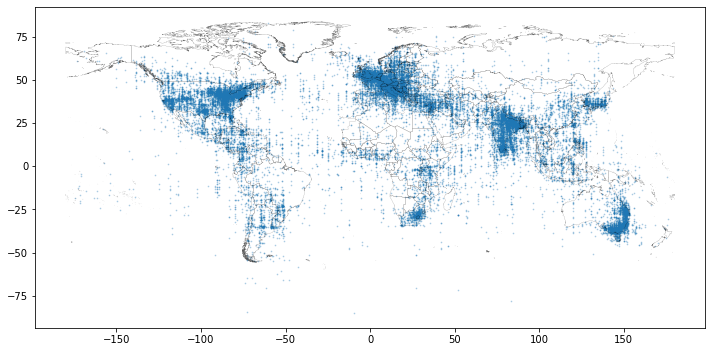

In [56]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.scatter(reconstructed_lon, reconstructed_lat, s=0.5, alpha=0.3)
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.2, alpha=0.5)

<AxesSubplot:>

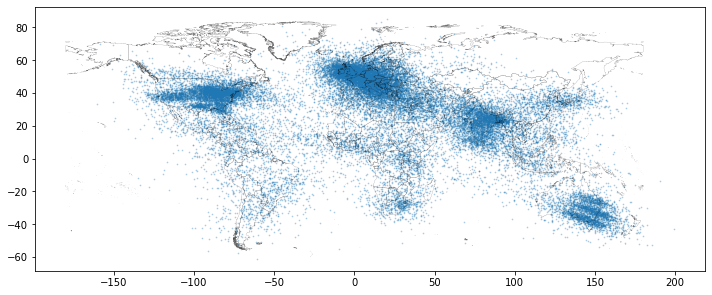

In [57]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.scatter(train_lon_proj, train_lat_proj, s=0.5, alpha=0.3)
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.2, alpha=0.5)

<AxesSubplot:>

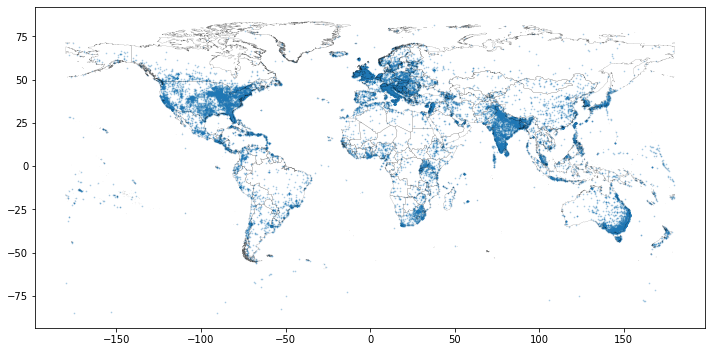

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.scatter(train_lon_true, train_lat_true, s=0.5, alpha=0.3)
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.2, alpha=0.5)

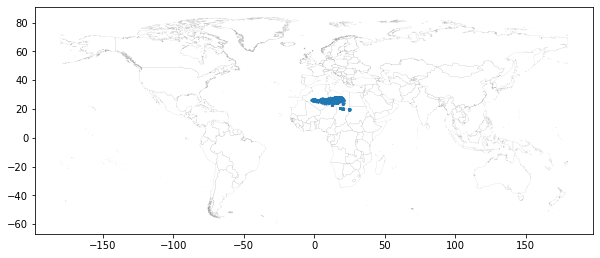

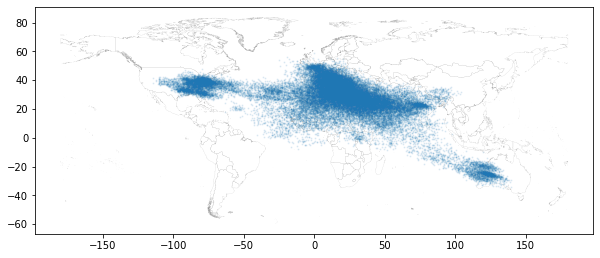

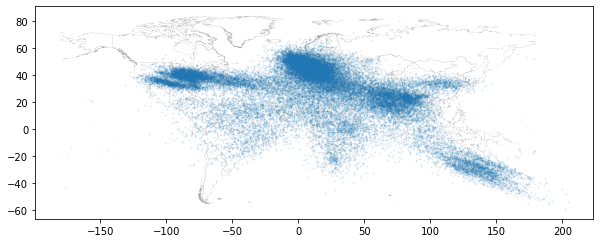

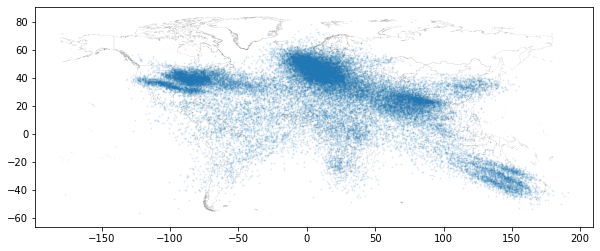

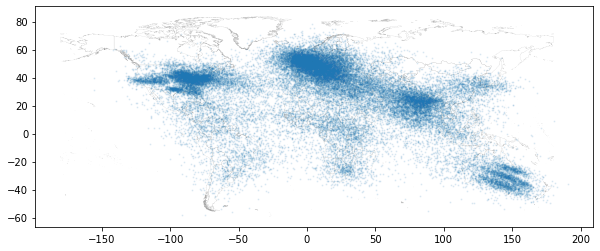

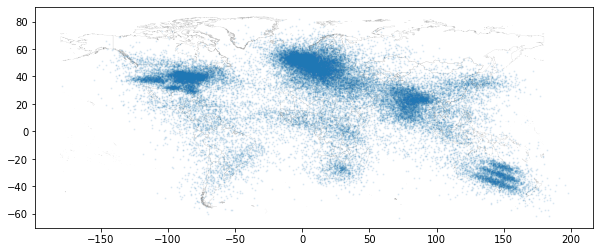

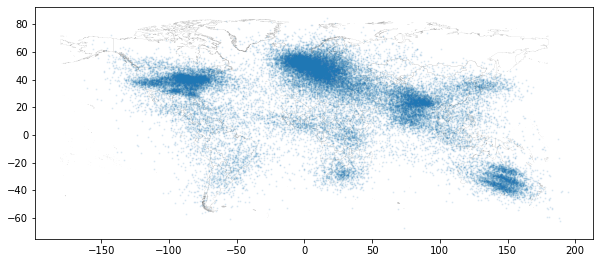

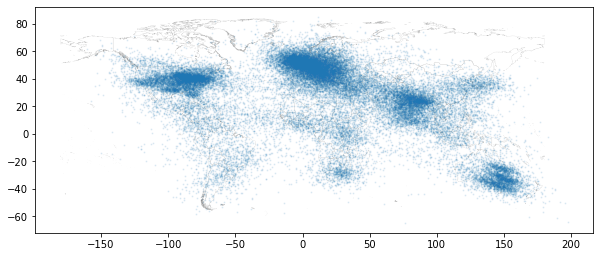

In [29]:
for i in range(0, 80, 10):
    fig, ax = plt.subplots(figsize=(10, 10))
    world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.2, alpha=0.2)
    ax.scatter(dfs[i].y.values, dfs[i].x.values, s=1, alpha=0.1)
    plt.show()

In [16]:
experiment_name = 'test_refactor'
model_name = 'Llama-2-70b-hf'
entity_type = 'us_place'
feature_name = 'coords'
prompt = 'where_us'
probe_result = load_probe_results(experiment_name, model_name, entity_type, feature_name, prompt)

us_df = load_entity_data('us_place')

us_shapes = gpd.read_file('data/shapes/cb_2018_us_state_20m')
US_FILTER_LIST = ['PR', 'AK', 'HI']
us_shapes = us_shapes.loc[~us_shapes.STUSPS.isin(US_FILTER_LIST)]

us_dfs = [probe_result['projections'][i] for i in range(len(probe_result['projections']))]

In [17]:
pd.DataFrame(probe_result['scores']).T.sort_values(('test', 'r2'))

train                                                                 \
        x_r2      y_r2        r2     x_mae      y_mae       mae         mse   
0   0.001969  0.004318  0.003143  4.109877  12.186774  8.148325  124.393304   
1   0.004326  0.009112  0.006719  4.106100  12.145198  8.125649  123.824523   
2   0.012152  0.026630  0.019391  4.088305  12.025979  8.057142  121.756122   
3   0.060705  0.180236  0.120470  3.958192  10.946691  7.452441  103.866834   
4   0.101506  0.255474  0.178490  3.852484  10.269635  7.061060   94.894412   
..       ...       ...       ...       ...        ...       ...         ...   
44  0.862787  0.886662  0.874724  1.256007   3.114211  2.185109   14.451019   
45  0.866075  0.889432  0.877753  1.236661   3.071223  2.153942   14.098667   
49  0.875928  0.896318  0.886123  1.193961   2.994476  2.094219   13.201930   
48  0.874361  0.895364  0.884863  1.199661   3.004759  2.102210   13.328597   
47  0.872744  0.893790  0.883267  1.207085   3.021015  2.114050   13.525739   

                                        ...      test                \
         rmse x_pearson    x_pearson_p  ... y_pearson   y_pearson_p   
0   11.153175  0.096963   3.177496e-51  ...  0.113386  1.265947e-18   
1   11.127647  0.124482   1.736486e-83  ...  0.134258  1.563621e-25   
2   11.034316  0.217565  5.017067e-255  ...  0.265774  1.558897e-97   
3   10.191508  0.432103   0.000000e+00  ...  0.652216  0.000000e+00   
4    9.741376  0.501521   0.000000e+00  ...  0.674961  0.000000e+00   
..        ...       ...            ...  ...       ...           ...   
44   3.801450  0.930304   0.000000e+00  ...  0.922631  0.000000e+00   
45   3.754819  0.931903   0.000000e+00  ...  0.922178  0.000000e+00   
49   3.633446  0.936870   0.000000e+00  ...  0.921717  0.000000e+00   
48   3.650835  0.936060   0.000000e+00  ...  0.921843  0.000000e+00   
47   3.677736  0.935221   0.000000e+00  ...  0.921806  0.000000e+00   

                                                                     \
   y_spearman   y_spearman_p y_kendall    y_kendall_p haversine_mse   
0    0.152606   1.381853e-32  0.102128   1.870771e-32  2.013746e+06   
1    0.178275   5.016211e-44  0.119368   1.044873e-43  2.005508e+06   
2    0.300824  1.025968e-125  0.205275  1.231929e-125  1.974068e+06   
3    0.656574   0.000000e+00  0.484737   0.000000e+00  1.681391e+06   
4    0.672276   0.000000e+00  0.496946   0.000000e+00  1.532932e+06   
..        ...            ...       ...            ...           ...   
44   0.908829   0.000000e+00  0.765686   0.000000e+00  3.081283e+05   
45   0.908991   0.000000e+00  0.766671   0.000000e+00  3.088549e+05   
49   0.907819   0.000000e+00  0.765650   0.000000e+00  3.095020e+05   
48   0.907983   0.000000e+00  0.766392   0.000000e+00  3.089919e+05   
47   0.908332   0.000000e+00  0.766677   0.000000e+00  3.087842e+05   

                                              
   haversine_rmse haversine_mae haversine_r2  
0     1419.065126   1247.975967     0.004441  
1     1416.159492   1244.619536     0.008513  
2     1405.015434   1234.313003     0.024057  
3     1296.684703   1136.680487     0.168751  
4     1238.116380   1077.338910     0.242146  
..            ...           ...          ...  
44     555.093045    368.941402     0.847667  
45     555.747168    367.700961     0.847308  
49     556.329075    366.194382     0.846988  
48     555.870380    365.569377     0.847240  
47     555.683545    365.943949     0.847343  

[80 rows x 48 columns]

In [18]:
us_proj_df = us_dfs[57]
is_test = us_proj_df.is_test.values
pred = us_proj_df[['x', 'y']].values
true = pred + us_proj_df[['x_error', 'y_error']].values

error_matrix = compute_proximity_error_matrix(
        true, pred, pairwise_haversine_distance)

train_error, test_error, combined_error = proximity_scores(
    error_matrix, is_test)

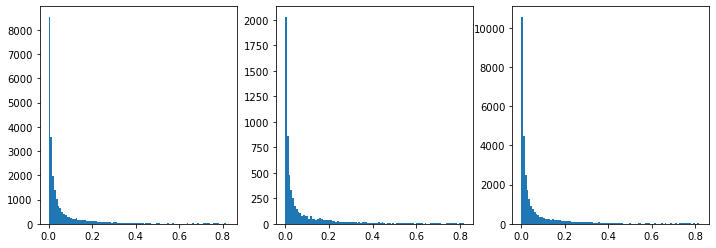

In [19]:
# histogram for each of train, test, combined error
fig, axs = plt.subplots(1, 3, figsize=(12, 4))

axs[0].hist(train_error, bins=100)
axs[1].hist(test_error, bins=100)
axs[2].hist(combined_error, bins=100);

In [20]:
test_error.mean(), combined_error[is_test].mean()

(0.07244203422135062, 0.07257352950942147)

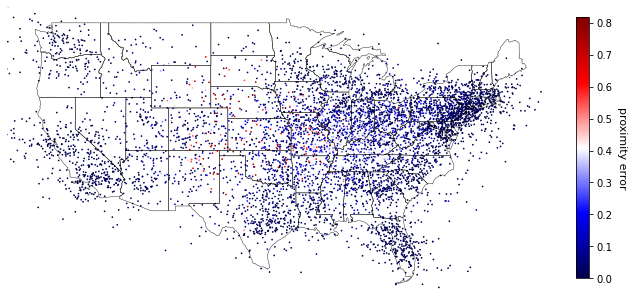

In [21]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(us_proj_df.y.values[is_test], us_proj_df.x.values[is_test], s=0.5, c=test_error, cmap='seismic')
us_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.8)
ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error', rotation=270, labelpad=15, fontsize=11)

ax.set_ylim(24, 50.5)
ax.set_xlim(-128, -65)
plt.show()

IndexError: boolean index did not match indexed array along dimension 0; dimension is 39585 but corresponding boolean dimension is 29997

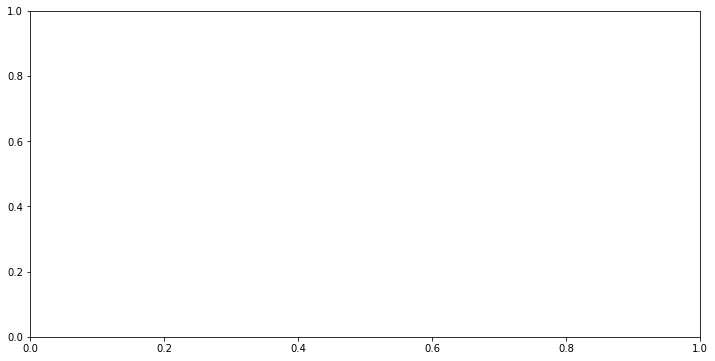

In [22]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(figsize=(12, 6))
sc = ax.scatter(world_proj_df.y.values[is_test], world_proj_df.x.values[is_test], s=0.3, c=test_error*100, cmap='seismic', norm=LogNorm(vmin=5e-1, vmax=9e1))
world_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.2, alpha=0.5)
ax.set_ylim(-55, 79)
ax.set_xlim(-151, 180)
ax.axis('off')

cbar = plt.colorbar(sc, ax=ax, shrink=0.8)
cbar.set_label('proximity error percentage (%)', rotation=270, labelpad=15, fontsize=11)

plt.show()

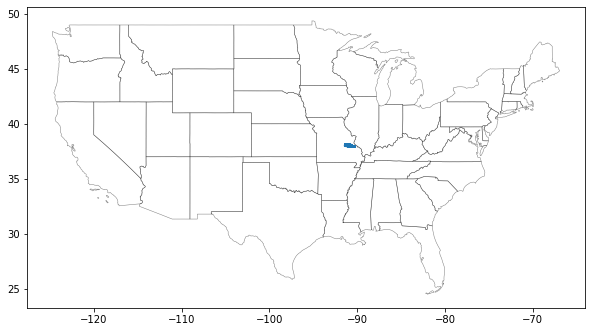

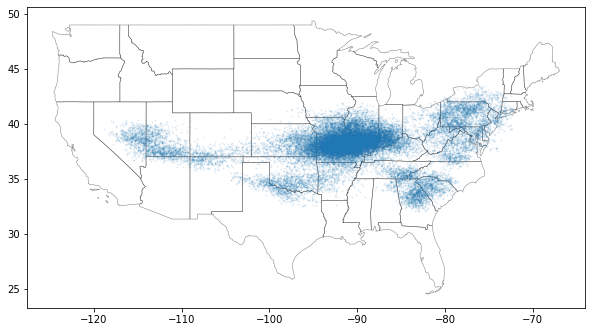

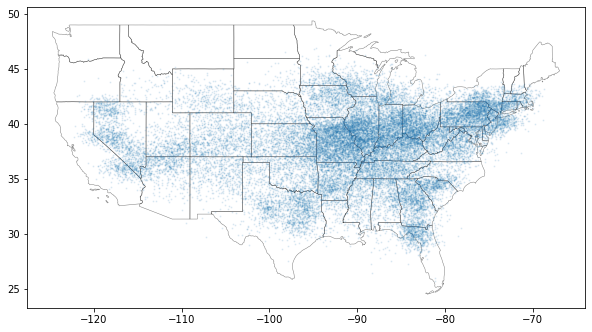

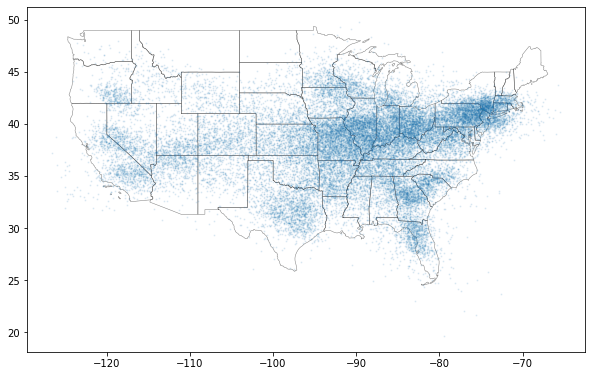

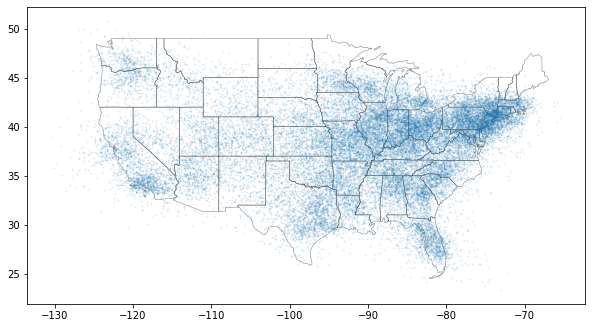

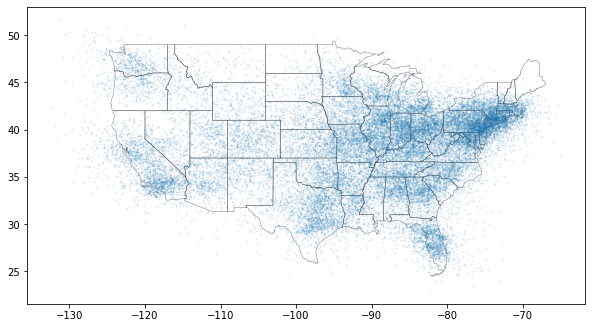

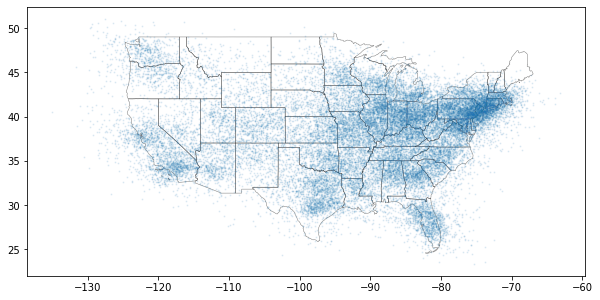

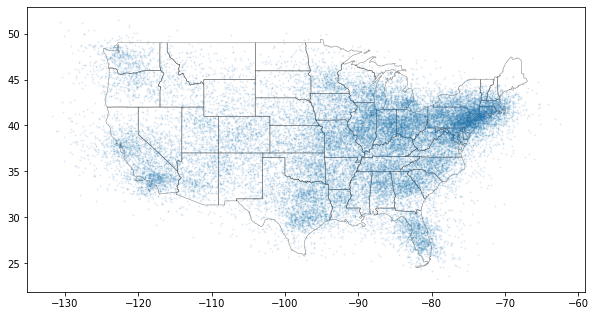

In [50]:
dfs = [probe_result['projections'][i] for i in range(len(probe_result['projections']))]
for i in range(0, 80, 10):
    fig, ax = plt.subplots(figsize=(10, 10))
    us_shapes.plot(ax=ax, color='none', edgecolor='black', lw=0.5, alpha=0.5)
    ax.scatter(dfs[i].y.values, dfs[i].x.values, s=1, alpha=0.1)
    plt.show()

In [27]:
# TODO: swap after error correction
world_df['x_proj'] = proj_df.y
world_df['y_proj'] = proj_df.x

world_df['x_error'] = proj_df.y_error
world_df['y_error'] = proj_df.x_error

from probes.evaluation import haversine_distance
world_df['dist_error'] = haversine_distance(world_df[['longitude', 'latitude']].values, world_df[['x_proj', 'y_proj']].values)

In [40]:
world_df.sort_values('dist_error').head(20)

,name,entity_subtype,country,latitude,longitude,has_thumbnail,page_views,entity_type,total_area,population,is_test,x_proj,y_proj,x_error,y_error,dist_error
15658,"Liberty Corner, New Jersey",PopulatedPlace,United_States,40.6647,-74.57750,1,10871.0,populated_place,4.998680e+06,1877.0,False,-74.573221,40.686730,0.004279,0.022030,0.806779
18259,Gowainghat Upazila,PopulatedPlace,Bangladesh,25.0000,91.00000,0,9069.0,populated_place,4.861000e+08,207170.0,True,91.003012,24.158145,0.003012,-0.841855,1.670093
31955,Saint-Anicet,PopulatedPlace,Canada,45.0864,-74.37140,1,8713.0,populated_place,1.802000e+08,2626.0,True,-74.363395,45.141565,0.008005,0.055165,1.877354
39126,Khabikki Lake,Lake,Pakistan,32.6219,72.21410,1,9536.0,natural_place,2.430000e+06,NaN,True,72.231006,32.587098,0.016906,-0.034802,2.220342
25411,Álftanes,PopulatedPlace,Iceland,64.1064,-22.01670,1,12259.0,populated_place,5.000000e+06,2484.0,False,-22.038212,64.118508,-0.021512,0.012108,2.698071
18113,"Girard, Illinois",PopulatedPlace,United_States,39.4458,-89.78140,1,8867.0,populated_place,2.408690e+06,1785.0,False,-89.808188,42.097868,-0.026788,2.652068,3.159601
26605,Barkatha (community development block),PopulatedPlace,India,24.1667,85.61670,0,5139.0,populated_place,2.810500e+08,122269.0,False,85.624840,24.549176,0.008140,0.382476,3.371213
17968,Lugton,PopulatedPlace,United_Kingdom,55.7439,-4.52764,1,6535.0,populated_place,NaN,80.0,False,-4.496597,55.761937,0.031043,0.018037,3.989099
7831,Kendrapara district,Region,India,20.5250,86.47500,1,55777.0,populated_place,2.644000e+09,1440361.0,False,86.443675,20.811024,-0.031325,0.286024,3.998798
31943,"Sabula, Iowa",PopulatedPlace,United_States,42.0678,-90.17420,1,30451.0,populated_place,3.770000e+06,506.0,False,-90.137947,41.616151,0.036253,-0.451649,4.033400


In [47]:
# plotly plot of error vs. page count where both are log scale
import plotly.express as px

fig = px.scatter(world_df, x="page_views", y="dist_error", hover_data=['name'], trendline='ols')
# Set both x and y axes to log scale
fig.update_layout(
    xaxis=dict(
        type='log',
        title='Page Views (Log Scale)'
    ),
    yaxis=dict(
        type='log',
        title='Dist Error (Log Scale)'
    )
)
fig.show()

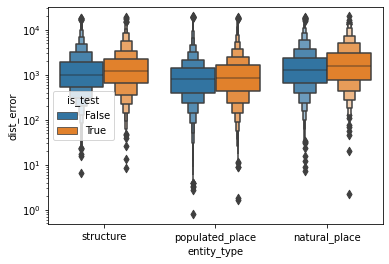

In [38]:
sns.boxenplot(data=world_df, y='dist_error', x='entity_type', hue='is_test')
plt.yscale('log')

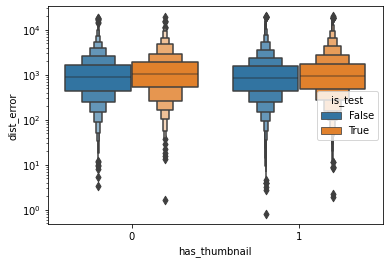

In [48]:
sns.boxenplot(data=world_df, y='dist_error', x='has_thumbnail', hue='is_test')
plt.yscale('log')

In [49]:
world_df.groupby('has_thumbnail').dist_error.describe().T

has_thumbnail,0,1
count,4040.000000,35545.000000
mean,1415.907573,1366.325251
std,1746.167698,1798.252075
min,1.670093,0.806779
25%,441.738241,437.274318
50%,896.538292,858.880171
75%,1688.315384,1575.357124
max,19219.009122,19667.967337


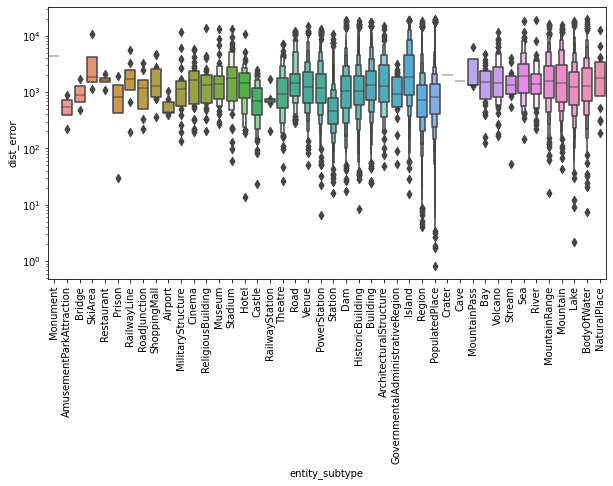

In [37]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxenplot(data=world_df, y='dist_error', x='entity_subtype')
plt.yscale('log')
# rotate x labels
plt.xticks(rotation=90);

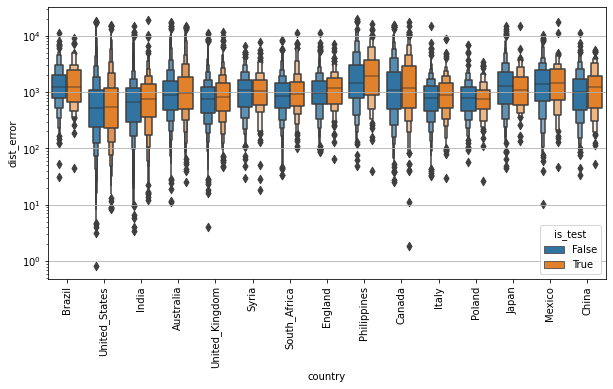

In [57]:
fig, ax = plt.subplots(figsize=(10, 5))
sns.boxenplot(data=world_df[world_df.country.isin(world_df.country.value_counts().head(15).index)], y='dist_error', x='country', hue='is_test')
plt.yscale('log')
# rotate x labels
plt.xticks(rotation=90);
plt.grid(axis='y')

In [52]:
world_df.country.value_counts().head(15)

United_States     6324
United_Kingdom    4096
India             3685
Australia         3373
Italy             1761
Canada            1116
South_Africa       748
England            567
Syria              534
Japan              533
Poland             460
China              443
Philippines        402
Brazil             398
Mexico             379
Name: country, dtype: int64

In [54]:
world_df.country.value_counts().head(15).index

Index(['United_States', 'United_Kingdom', 'India', 'Australia', 'Italy',
       'Canada', 'South_Africa', 'England', 'Syria', 'Japan', 'Poland',
       'China', 'Philippines', 'Brazil', 'Mexico'],
      dtype='object')